In [35]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import ConnectionPatch
import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv("employee_data.csv")

In [3]:
df.shape

(1470, 35)

In [4]:
df.sample(5)

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
350,42,No,Travel_Rarely,544,Human Resources,2,1,Technical Degree,1,470,...,3,80,1,4,5,3,3,2,1,0
1223,47,Yes,Travel_Frequently,1093,Sales,9,3,Life Sciences,1,1716,...,3,80,0,25,3,1,23,5,14,10
1143,45,No,Non-Travel,336,Sales,26,3,Marketing,1,1612,...,1,80,1,10,2,3,10,7,4,5
261,38,No,Non-Travel,1327,Sales,2,2,Life Sciences,1,361,...,4,80,1,13,0,3,8,7,7,5
920,34,No,Travel_Frequently,135,Research & Development,19,3,Medical,1,1285,...,3,80,2,15,2,4,11,8,5,10


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

- No missing values in any column

In [6]:
df.nunique()

Age                           43
Attrition                      2
BusinessTravel                 3
DailyRate                    886
Department                     3
DistanceFromHome              29
Education                      5
EducationField                 6
EmployeeCount                  1
EmployeeNumber              1470
EnvironmentSatisfaction        4
Gender                         2
HourlyRate                    71
JobInvolvement                 4
JobLevel                       5
JobRole                        9
JobSatisfaction                4
MaritalStatus                  3
MonthlyIncome               1349
MonthlyRate                 1427
NumCompaniesWorked            10
Over18                         1
OverTime                       2
PercentSalaryHike             15
PerformanceRating              2
RelationshipSatisfaction       4
StandardHours                  1
StockOptionLevel               4
TotalWorkingYears             40
TrainingTimesLastYear          7
WorkLifeBa

#### Columns having only one values or no significance can be removed:
- EmployeeCount
- Over18
- StandardHours
- EmployeeNumber

In [7]:
df.drop(columns=['EmployeeCount', 'Over18', 'StandardHours', 'EmployeeNumber'], inplace=True)
df.shape

(1470, 31)

In [8]:
df['Education'].unique()

array([2, 1, 4, 3, 5])

In [9]:
df['EnvironmentSatisfaction'].unique()

array([2, 3, 4, 1])

In [10]:
df['JobInvolvement'].unique()

array([3, 2, 4, 1])

In [11]:
df['JobLevel'].unique()

array([2, 1, 3, 4, 5])

In [12]:
df['JobSatisfaction'].unique()

array([4, 2, 3, 1])

In [13]:
df['PerformanceRating'].unique()

array([3, 4])

In [14]:
df['RelationshipSatisfaction'].unique()

array([1, 4, 2, 3])

In [15]:
df['StockOptionLevel'].unique()

array([0, 1, 3, 2])

In [16]:
df['WorkLifeBalance'].unique()

array([1, 3, 2, 4])

- Not clear what above columns specifies here

In [17]:
df.drop(columns=['Education', 'EnvironmentSatisfaction', 'JobInvolvement', 'JobLevel', 'JobSatisfaction', 'PerformanceRating', 'RelationshipSatisfaction', 'StockOptionLevel', 'WorkLifeBalance'], inplace=True)
df.shape

(1470, 22)

In [18]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 22 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   Age                      1470 non-null   int64 
 1   Attrition                1470 non-null   object
 2   BusinessTravel           1470 non-null   object
 3   DailyRate                1470 non-null   int64 
 4   Department               1470 non-null   object
 5   DistanceFromHome         1470 non-null   int64 
 6   EducationField           1470 non-null   object
 7   Gender                   1470 non-null   object
 8   HourlyRate               1470 non-null   int64 
 9   JobRole                  1470 non-null   object
 10  MaritalStatus            1470 non-null   object
 11  MonthlyIncome            1470 non-null   int64 
 12  MonthlyRate              1470 non-null   int64 
 13  NumCompaniesWorked       1470 non-null   int64 
 14  OverTime                 1470 non-null  

In [19]:
df.describe()

,Age,DailyRate,DistanceFromHome,HourlyRate,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,802.485714,9.192517,65.891156,6502.931293,14313.103401,2.693197,15.209524,11.279592,2.799320,7.008163,4.229252,2.187755,4.123129
std,9.135373,403.509100,8.106864,20.329428,4707.956783,7117.786044,2.498009,3.659938,7.780782,1.289271,6.126525,3.623137,3.222430,3.568136
min,18.000000,102.000000,1.000000,30.000000,1009.000000,2094.000000,0.000000,11.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,465.000000,2.000000,48.000000,2911.000000,8047.000000,1.000000,12.000000,6.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,802.000000,7.000000,66.000000,4919.000000,14235.500000,2.000000,14.000000,10.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,1157.000000,14.000000,83.750000,8379.000000,20461.500000,4.000000,18.000000,15.000000,3.000000,9.000000,7.000000,3.000000,7.000000
max,60.000000,1499.000000,29.000000,100.000000,19999.000000,26999.000000,9.000000,25.000000,40.000000,6.000000,40.000000,18.000000,15.000000,17.000000


Text(0.5, 1.0, 'Employee Attrition Count')

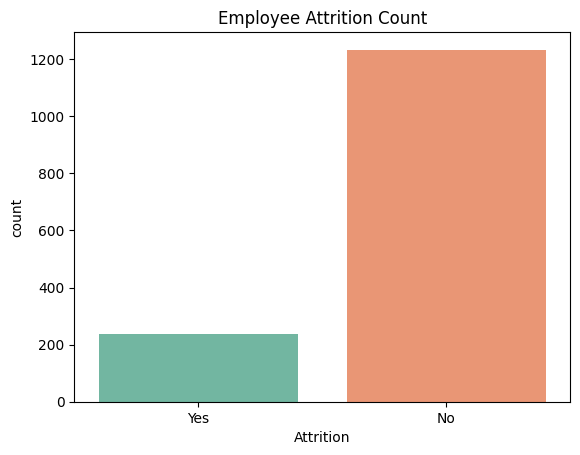

In [34]:
#Target Variable Distribution
sns.countplot(data=df, x="Attrition", palette="Set2")
plt.title("Employee Attrition Count")

## Correlation matrix

<Axes: >

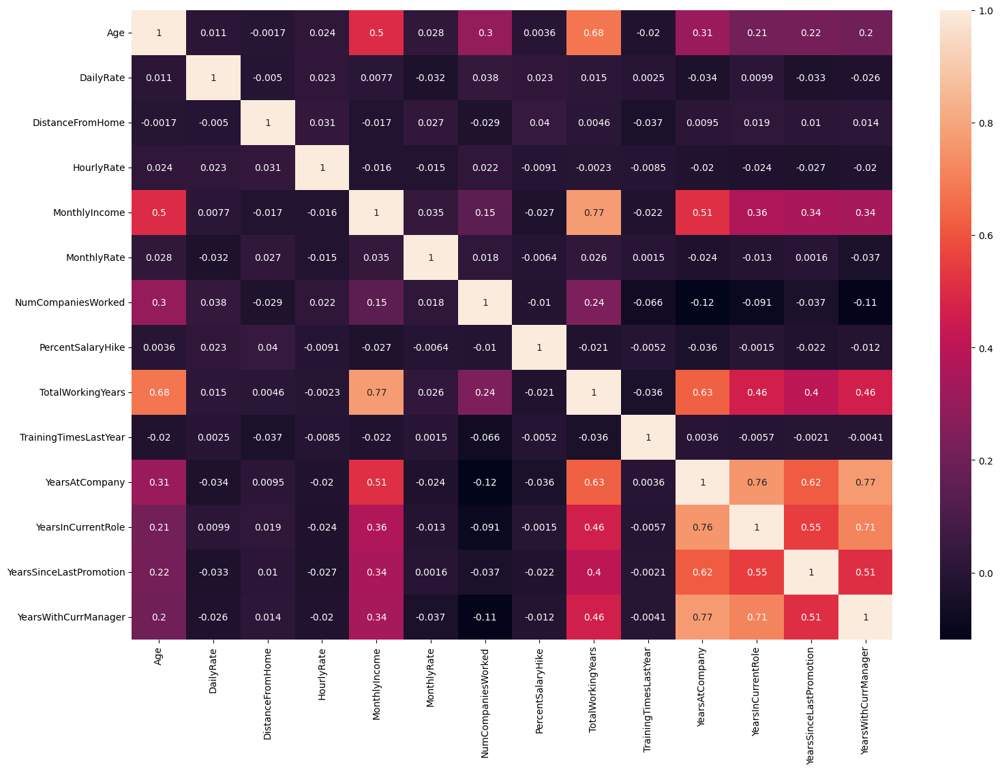

In [20]:
plt.figure(figsize=(18,12))
sns.heatmap(df.select_dtypes(include=['int64']).corr(), annot=True)

#### Insights
- High positive correlation between YearsWithCurManager, YearsInCurRole, LastPromotion and TotalWorYears suggests that old employees are not promoted although their salaries may increase, or people may already be hired with higher salaries but are not promoted later
- Age is also playing a major role

In [21]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 22 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   Age                      1470 non-null   int64 
 1   Attrition                1470 non-null   object
 2   BusinessTravel           1470 non-null   object
 3   DailyRate                1470 non-null   int64 
 4   Department               1470 non-null   object
 5   DistanceFromHome         1470 non-null   int64 
 6   EducationField           1470 non-null   object
 7   Gender                   1470 non-null   object
 8   HourlyRate               1470 non-null   int64 
 9   JobRole                  1470 non-null   object
 10  MaritalStatus            1470 non-null   object
 11  MonthlyIncome            1470 non-null   int64 
 12  MonthlyRate              1470 non-null   int64 
 13  NumCompaniesWorked       1470 non-null   int64 
 14  OverTime                 1470 non-null  

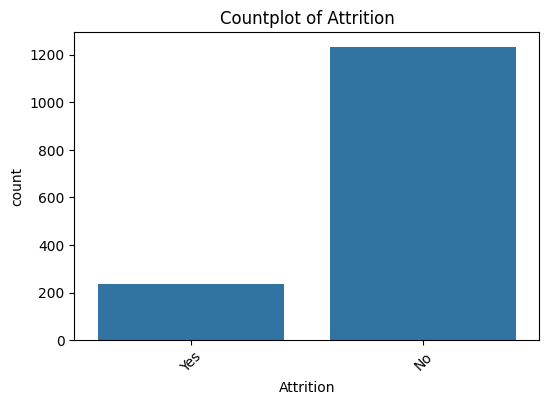

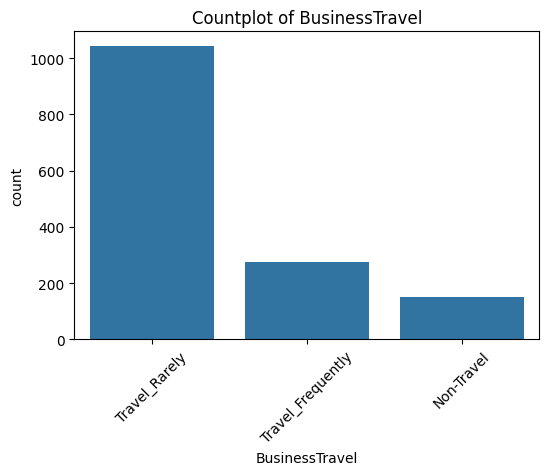

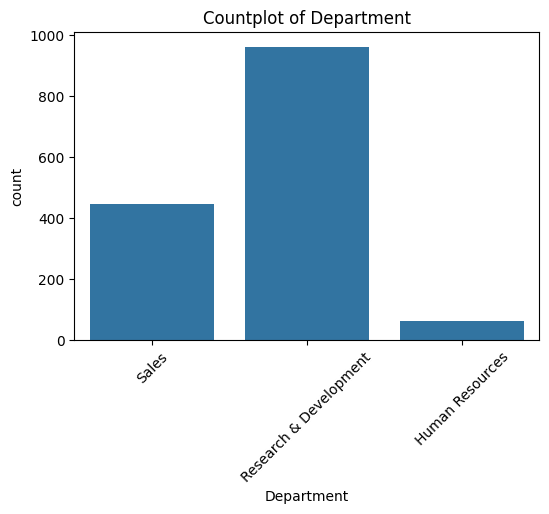

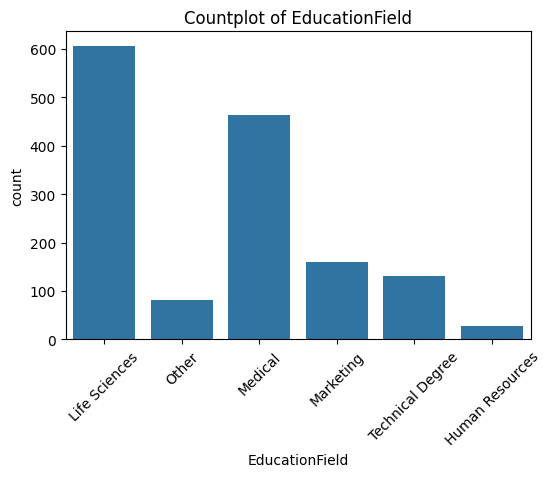

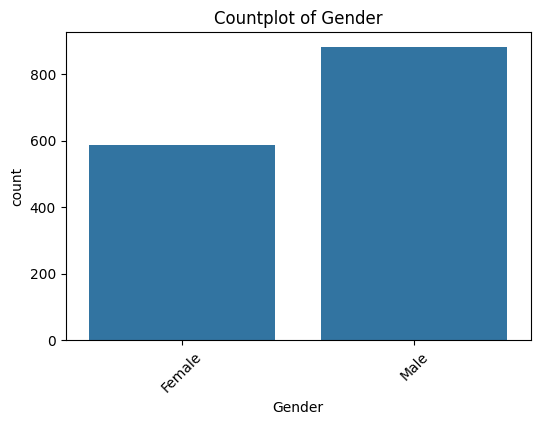

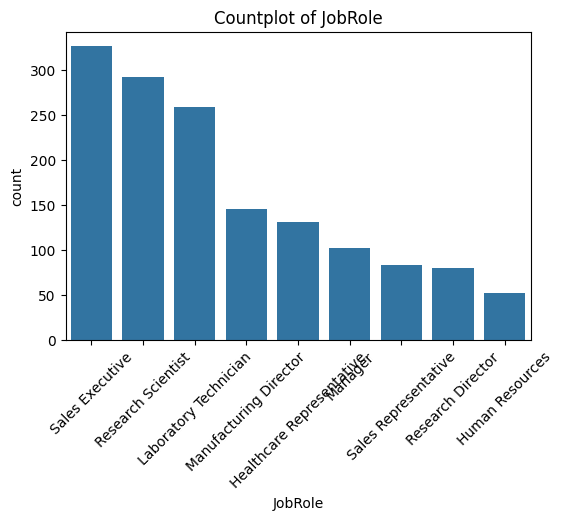

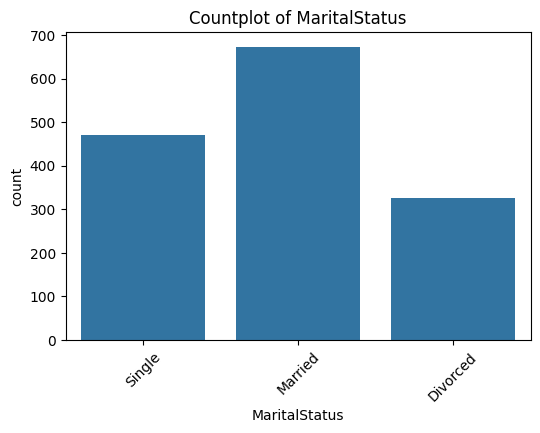

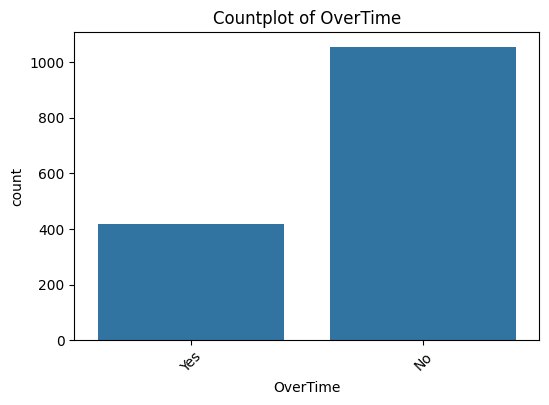

In [22]:
for column in df.columns:
        if df[column].dtype == 'object' or pd.api.types.is_categorical_dtype(df[column]):
            plt.figure(figsize=(6, 4)) 
            sns.countplot(x=column, data=df)
            plt.title(f'Countplot of {column}')
            plt.xticks(rotation=45)
            plt.show()

#### Insights
- Most employees do not show Attrition
- Most employees travel rarely
- R&D department has the most no. of employees followed by Sale department
- There are more male employees compared to females
- Most employees are concentrated in roles like sale executive, research scientist and lab technicians
- Most of the employees are married
- Most employees do not do overtime

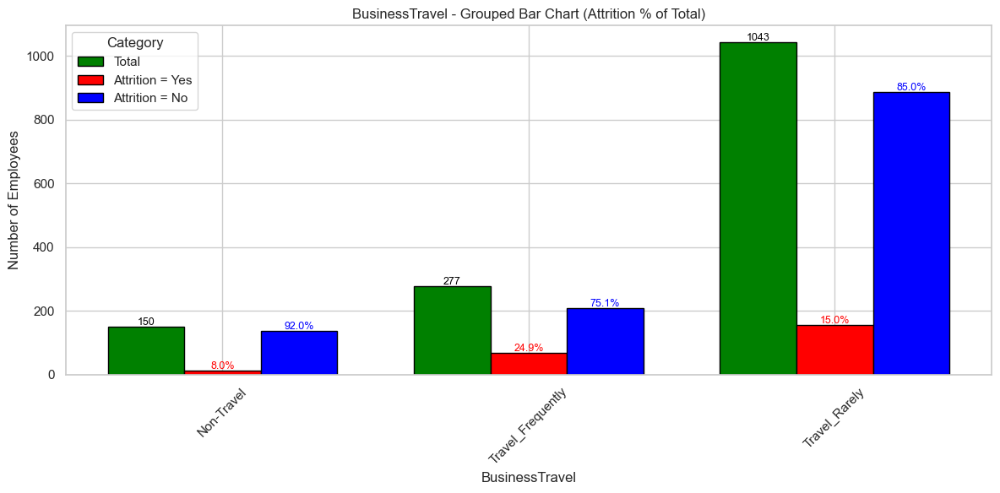

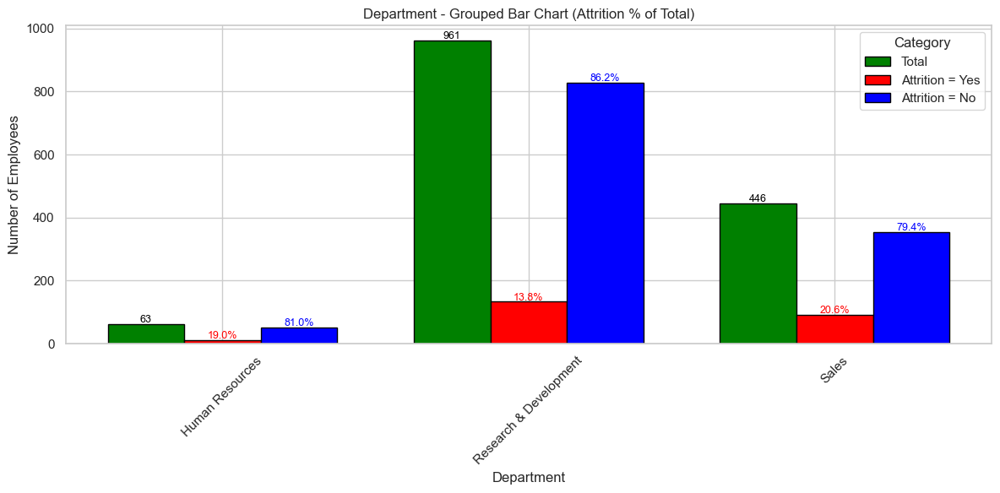

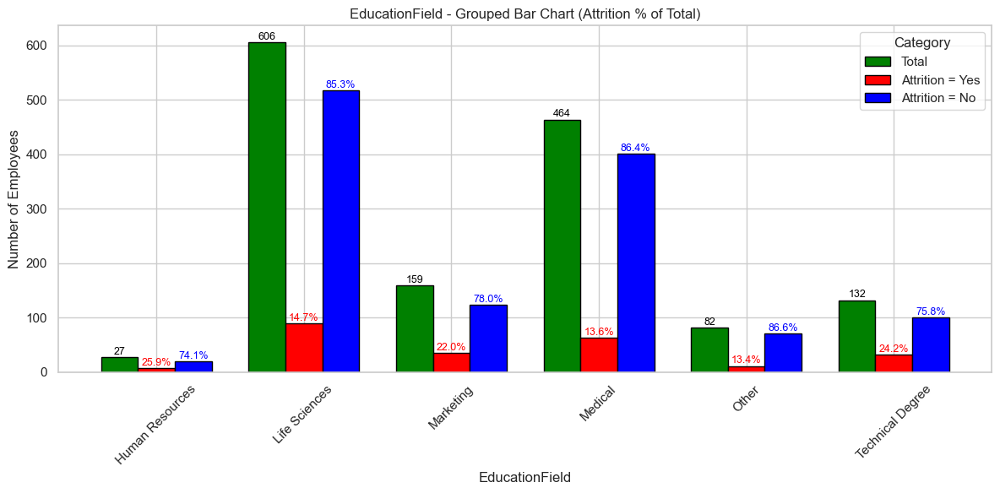

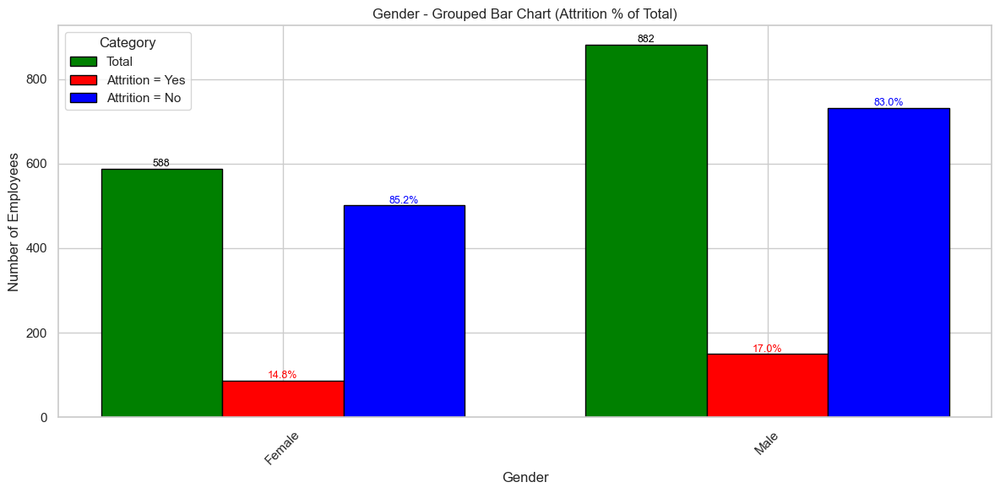

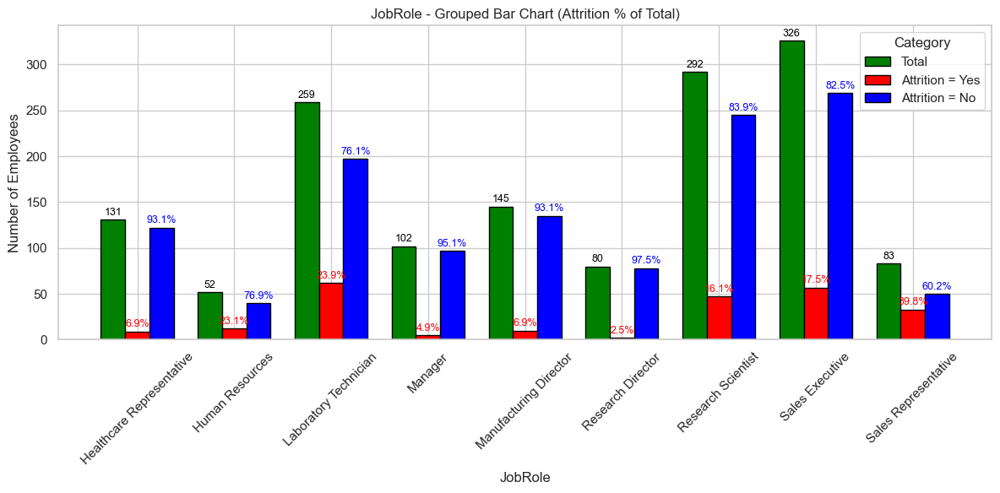

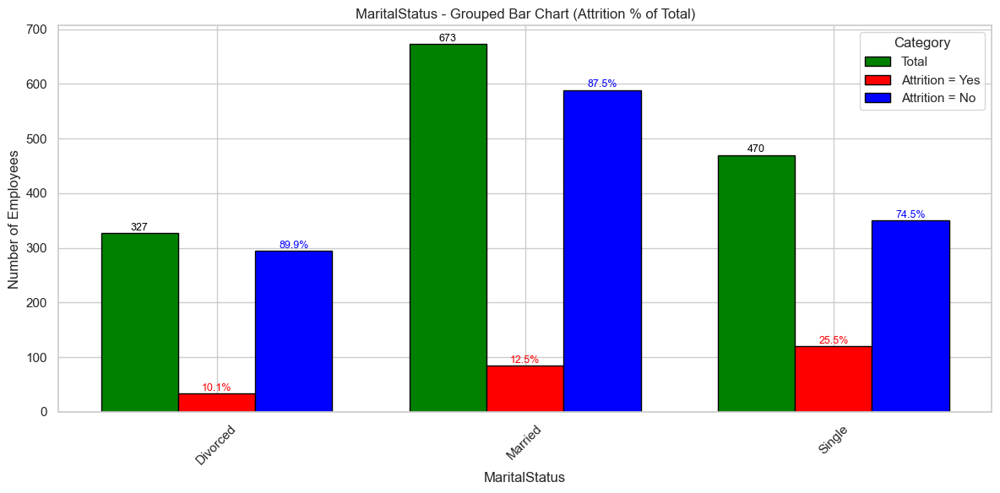

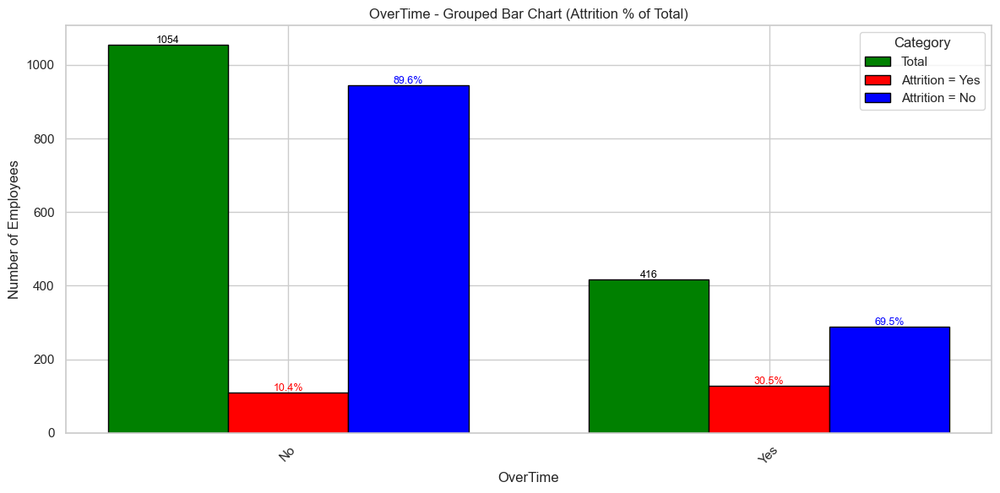

In [59]:
sns.set(style="whitegrid")

categorical_cols = df.select_dtypes(include='object').columns
categorical_cols = [col for col in categorical_cols if col != 'Attrition']

for col in categorical_cols:
    total_counts = df[col].value_counts().sort_index()
    yes_counts = df[df['Attrition'] == 'Yes'][col].value_counts().sort_index()
    no_counts = df[df['Attrition'] == 'No'][col].value_counts().sort_index()

    all_categories = sorted(set(total_counts.index).union(yes_counts.index).union(no_counts.index))
    total_counts = total_counts.reindex(all_categories, fill_value=0)
    yes_counts = yes_counts.reindex(all_categories, fill_value=0)
    no_counts = no_counts.reindex(all_categories, fill_value=0)

    plot_df = pd.DataFrame({
        'Total': total_counts,
        'Attrition = Yes': yes_counts,
        'Attrition = No': no_counts
    }, index=all_categories)

    fig, ax = plt.subplots(figsize=(12, 6))

    bar_width = 0.25
    x_positions = range(len(plot_df))

    total_bars = ax.bar([x - bar_width for x in x_positions], 
                        plot_df['Total'], 
                        width=bar_width, color='green', edgecolor='black', label='Total')
    
    yes_bars = ax.bar(x_positions, 
                      plot_df['Attrition = Yes'], 
                      width=bar_width, color='red', edgecolor='black', label='Attrition = Yes')
    
    no_bars = ax.bar([x + bar_width for x in x_positions], 
                     plot_df['Attrition = No'], 
                     width=bar_width, color='blue', edgecolor='black', label='Attrition = No')

    for i, cat in enumerate(plot_df.index):
        total = plot_df.loc[cat, 'Total']
        yes = plot_df.loc[cat, 'Attrition = Yes']
        no = plot_df.loc[cat, 'Attrition = No']

        if total == 0:
            continue

        yes_percent = (yes / total) * 100
        no_percent = (no / total) * 100

        ax.text(i - bar_width, total + 5, f"{total}", ha='center', color='black', fontsize=9)
        ax.text(i, yes + 5, f"{yes_percent:.1f}%", ha='center', color='red', fontsize=9)
        ax.text(i + bar_width, no + 5, f"{no_percent:.1f}%", ha='center', color='blue', fontsize=9)

    plt.title(f'{col} - Grouped Bar Chart (Attrition % of Total)')
    plt.xlabel(col)
    plt.ylabel('Number of Employees')
    plt.xticks(x_positions, plot_df.index, rotation=45)
    plt.legend(title='Category')
    plt.tight_layout()
    plt.show()

#### Insights
- Employees who Travel frequently show highr attrition, which maybe to due to poos travel experience
- Sales and Human Resources department show higher attrition rate
- Employees having education/degree in HR, Marketing and Technical show higher attrition rate
- Males show higher attrition than females
- Sales representatives, lab technician and HR show higher attrition rate
- Single employees show higher attrition probably due to no family burden and job switching flexibily
- Employees working overtime show higher attrition, so overtime benefits and conditions of the employees should be focused on more

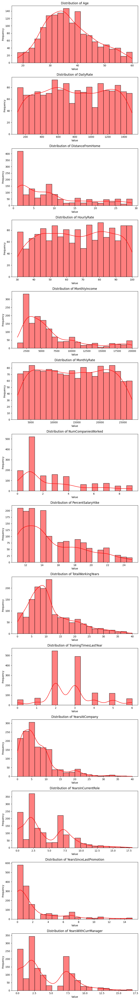

In [23]:
numerical_cols = df.select_dtypes(include=['int64']).columns
fig, axes = plt.subplots(nrows=len(numerical_cols), ncols=1, figsize=(8, 4 * len(numerical_cols)))
for i, col in enumerate(numerical_cols):
    sns.histplot(data=df, x=col, kde=True, ax=axes[i], bins=20, color='red')
    axes[i].set_title(f'Distribution of {col}')
    axes[i].set_xlabel('Value')
    axes[i].set_ylabel('Frequency')
plt.tight_layout()
plt.show()

#### Insights
- Age: Almost normaly distributes
- Highly right skewed data:
  - Distance from home
  - Monthly Income
  - Num of companies worked
  - % salary hike
  - Total working years
  - Years at company
  - Years in current position
  - Years since last promoted
  - Years with current manager

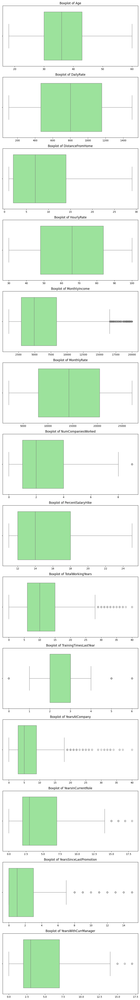

In [24]:
fig, axes = plt.subplots(nrows=len(numerical_cols), ncols=1, figsize=(8, 4 * len(numerical_cols)))

for i, col in enumerate(numerical_cols):
    sns.boxplot(x=df[col], ax=axes[i], color='lightgreen')
    axes[i].set_title(f'Boxplot of {col}')
    axes[i].set_xlabel('')

plt.tight_layout()
plt.show()

A number of outliers are seen in
- MonthlyIncome
- TotalWorkingYears
- YearsAtCompany
- YearsSinceLastPromotion
which makes sense as all these categories are highly correlated

Few Outliers appear in
- YearsWithCurrManager
- YearsInCurrentRole
- TrainingTimesLastYear
- NumCompaniesWorked

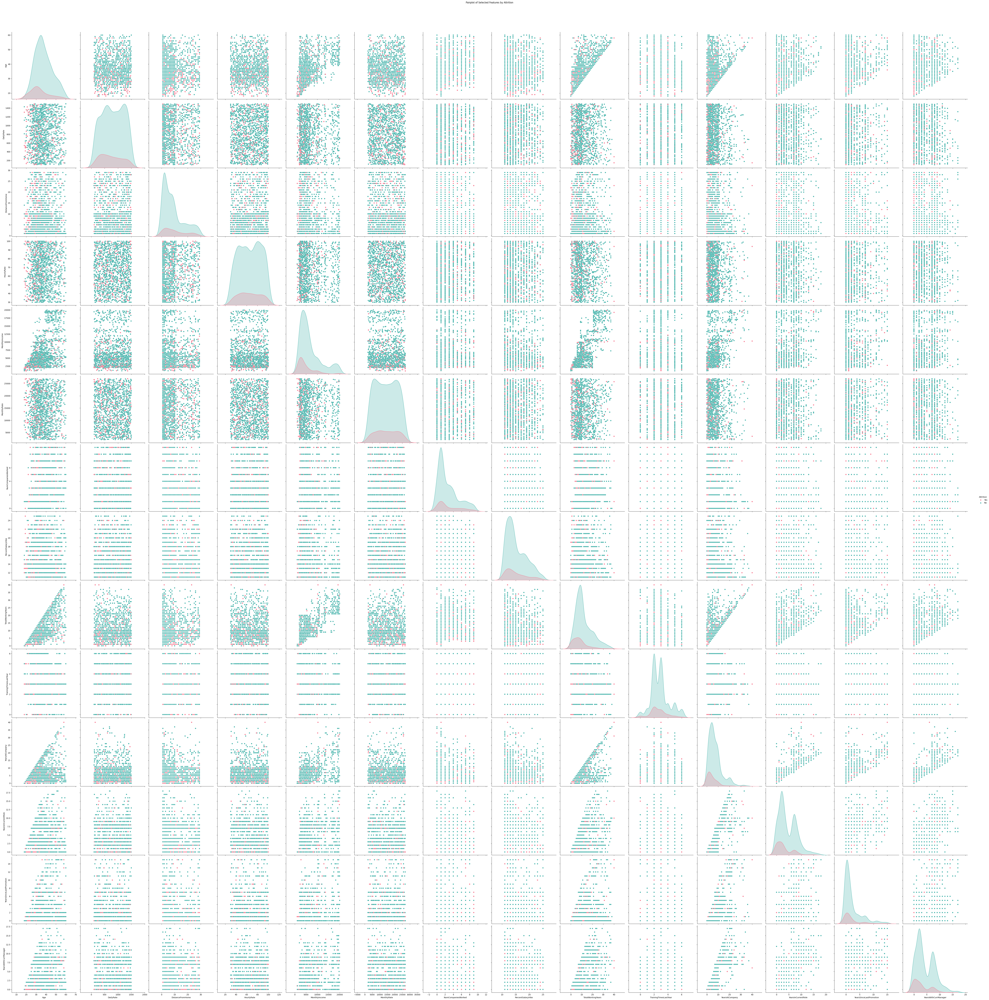

<Figure size 2000x1200 with 0 Axes>

In [25]:
pair = sns.pairplot(df, hue="Attrition", palette="husl", height=5, aspect=1)
pair.fig.suptitle("Pairplot of Selected Features by Attrition", y=1.02)
pair.savefig("pairplot_attrition.png")
plt.figure(figsize=(20, 12))
plt.show()

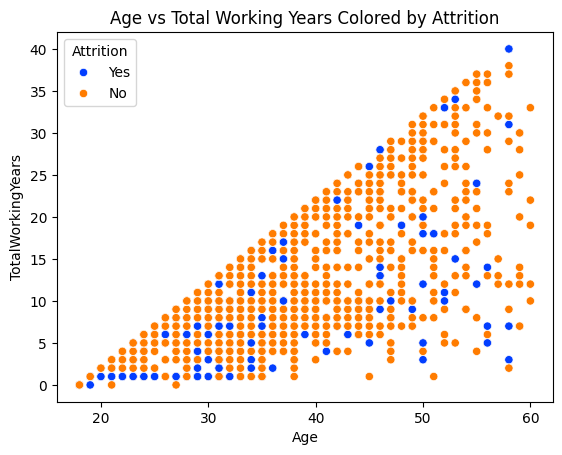

In [26]:
sns.scatterplot(data=df, x="Age", y="TotalWorkingYears", hue="Attrition", palette="bright")
plt.title("Age vs Total Working Years Colored by Attrition")
plt.show()

In [27]:
df['AgeBand'] = pd.cut(df['Age'], bins=[18, 30, 40, 50, 60], labels=['18–30', '31–40', '41–50', '51–60'])

attrition_by_age = df.groupby(['AgeBand', 'Attrition']).size().unstack()
attrition_by_age['Attrition Rate (%)'] = (attrition_by_age['Yes'] / attrition_by_age.sum(axis=1)) * 100
attrition_by_age

Attrition,No,Yes,Attrition Rate (%)
AgeBand,,,
18–30,282,96,25.396825
31–40,534,85,13.731826
41–50,288,34,10.559006
51–60,125,18,12.587413


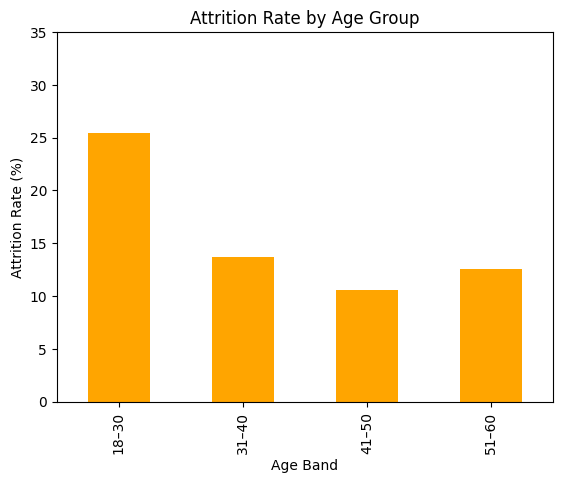

In [28]:
attrition_by_age['Attrition Rate (%)'].plot(kind='bar', color='orange')
plt.title("Attrition Rate by Age Group")
plt.ylabel("Attrition Rate (%)")
plt.xlabel("Age Band")
plt.ylim(0, 35)
plt.show()

#### Attrition appears significantly higher among younger employees with fewer total working years, indicating that early-career professionals are more likely to leave the company. This may suggest the need for improved onboarding, mentorship, or growth opportunities targeted at this group.

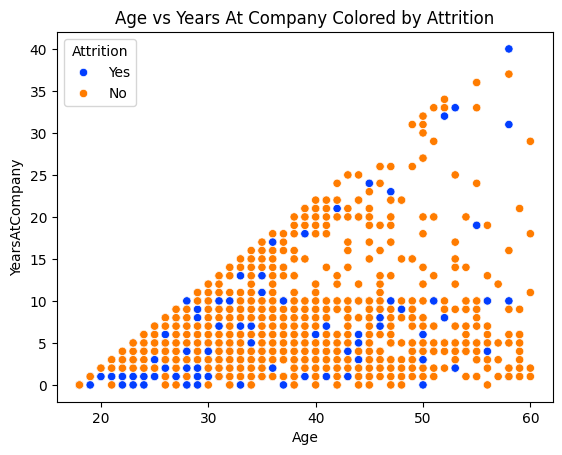

In [29]:
sns.scatterplot(data=df, x="Age", y="YearsAtCompany", hue="Attrition", palette="bright")
plt.title("Age vs Years At Company Colored by Attrition")
plt.show()

In [32]:
df['CompanyAgeBand'] = pd.cut(df['YearsAtCompany'], bins=[0, 10, 20, 30, 40], labels=['0–10', '11–20', '21–30', '31–40'])

attrition_by_age = df.groupby(['CompanyAgeBand', 'Attrition']).size().unstack()
attrition_by_age['Attrition Rate (%)'] = (attrition_by_age['Yes'] / attrition_by_age.sum(axis=1)) * 100
attrition_by_age

Attrition,No,Yes,Attrition Rate (%)
CompanyAgeBand,,,
0–10,979,201,17.033898
11–20,168,12,6.666667
21–30,46,4,8.000000
31–40,12,4,25.000000


#### Insight
- YearsAtCompany and TotalWorkingYears show highly similar behaviour hence one of them can be removed to reduce dimensions for better prediction

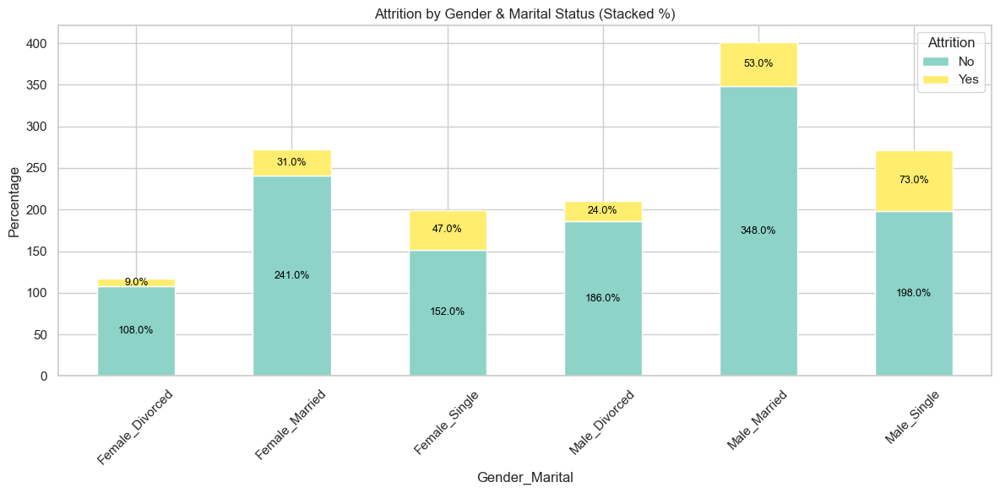

In [62]:
df['Gender_Marital'] = df['Gender'] + "_" + df['MaritalStatus']
ct = pd.crosstab(df['Gender_Marital'], df['Attrition'])

ct_percent = ct.div(ct.sum(axis=1), axis=0) * 100

ax = ct.plot(kind='bar', stacked=True, figsize=(12, 6), colormap='Set3')

for p in ax.patches:
    width, height = p.get_width(), p.get_height()
    x, y = p.get_xy()
    if height > 0:  # Only label bars with height > 0
        ax.text(x + width/2, 
                y + height/2, 
                f'{height:.1f}%', 
                ha='center', 
                va='center',
                color='black',
                fontsize=9)

plt.title('Attrition by Gender & Marital Status (Stacked %)')
plt.xlabel('Gender_Marital')
plt.ylabel('Percentage')
plt.xticks(rotation=45)
plt.legend(title='Attrition')
plt.tight_layout()
plt.show()

#### Insight
- Single men and women show the highest attrition
- Married men show higher attrition than married female
Conclusion: Marital status has similar effect for both the genders